In [163]:
import math
import numpy as np

import mido
import librosa
import librosa.display

import IPython.display as ipd
import matplotlib.pyplot as plt
from torch import optim

import torch.nn.functional as F
from torch import nn
import torch

In [209]:
y, sr = librosa.load('4Beats2MelLong2.wav')

In [210]:
D = librosa.stft(y)

In [211]:
#ipd.Audio(y_hat,rate=sr) # load a local WAV file
ipd.Audio(y,rate=sr); # load a local WAV file

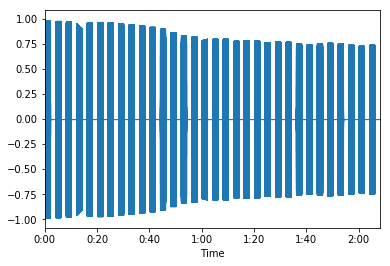

In [212]:
librosa.display.waveplot(y, sr=sr);

In [249]:
midiArray=[]
HopSize=0.023
timeTracker=0.0
totalTimeTracker=0.0
MemoryArray=np.zeros(128)
lasttime=0;
bpm=60
for msg in mido.MidiFile('4Beats2MelLong2.mid'):
    if not msg.is_meta:
        totalTimeTracker+=msg.time
        nextEventTime=lasttime+msg.time
        while nextEventTime> timeTracker + HopSize:
            MemoryArray[127]=((timeTracker%4) * (bpm/60.0))/4.0
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize;
        if msg.type=='note_on':
            MemoryArray[msg.note]+=1.0;
        elif msg.type=='note_off':
            MemoryArray[msg.note]-=1.0;
        if(timeTracker+msg.time >= timeTracker + HopSize):
            MemoryArray[127]=((timeTracker%4) * (bpm/60.0))/4.0
            midiArray.append(MemoryArray.copy())
            timeTracker += HopSize
        lasttime += msg.time
    else:
        if(msg.type == 'set_tempo'):
            bpm=60000000/msg.tempo
        

(5513, 1025) (2740, 128)


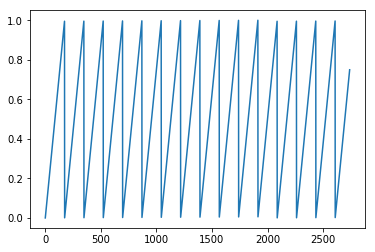

[0.      0.00575 0.0115  ... 0.73775 0.7435  0.74925]


In [250]:
midiArray=np.float32(np.array(midiArray))
D_t=D.T
print(D_t.shape,midiArray.shape)
plt.plot(midiArray[:,127])
plt.show()
print(midiArray[:,127])

In [251]:
minLength = min(midiArray.shape[0],D_t.real.shape[0])

D_data=D_t[:minLength].real;
midiArray=midiArray[:minLength];
print(midiArray.shape,D_data.shape)
print(midiArray.dtype,D_data.dtype)

(2740, 128) (2740, 1025)
float32 float32


In [252]:
## Solution

class Network(nn.Module):
    def __init__(self):
        super().__init__()
        # Defining the layers, 128, 64, 10 units each
        self.fc1 = nn.Linear(128, 500)
        self.fc2 = nn.Linear(500, 700)
        # Output layer, 10 units - one for each digit
        self.fc3 = nn.Linear(700, 1025)
    def forward(self, x):
        ''' Forward pass through the network, returns the output logits '''
        
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = F.relu(x)
        x = self.fc3(x)
        return x

model = Network()
model

Network(
  (fc1): Linear(in_features=128, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=700, bias=True)
  (fc3): Linear(in_features=700, out_features=1025, bias=True)
)

In [253]:
import torch.utils.data as utils


tensor_x = torch.stack([torch.Tensor(i) for i in np.abs(midiArray)]) # transform to torch tensors
tensor_y = torch.stack([torch.Tensor(i) for i in np.abs(D_data)])
print(tensor_x.shape,tensor_y.shape)
my_dataset = utils.TensorDataset(tensor_x,tensor_y) # create your datset
my_dataloader = utils.DataLoader(my_dataset,batch_size=64) # create your dataloader
my_testloader = utils.DataLoader(my_dataset) # create your dataloader


# Optimizers require the parameters to optimize and a learning rate
optimizer = optim.SGD(model.parameters(), lr=0.01)

criterion = nn.MSELoss()
# Get our data


torch.Size([2740, 128]) torch.Size([2740, 1025])


In [254]:
##REset
Counter=0;
LossOverEpoch=[]
model.train()

Network(
  (fc1): Linear(in_features=128, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=700, bias=True)
  (fc3): Linear(in_features=700, out_features=1025, bias=True)
)

In [255]:
epochs = 500
for i in range(epochs):
    running_loss = 0
    for data, labels in my_dataloader:
        optimizer.zero_grad()     
        logits = model(data)
        loss =criterion(logits,labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
    else:
        LossOverEpoch.append(running_loss)
        print(f"Training loss: {running_loss/len(my_dataloader)}" +"   "+ str(Counter))
        Counter+=1

Training loss: 15.664020736567773   0
Training loss: 15.65892753882339   1
Training loss: 15.65384197705642   2
Training loss: 15.64873186894151   3
Training loss: 15.643559733890323   4
Training loss: 15.638317803970029   5
Training loss: 15.632987457491339   6
Training loss: 15.627539370543333   7
Training loss: 15.621944054292493   8
Training loss: 15.616173192127716   9
Training loss: 15.610195285229143   10
Training loss: 15.603978208011709   11
Training loss: 15.597480457045982   12
Training loss: 15.59065583888658   13
Training loss: 15.583453870405508   14
Training loss: 15.575819822131159   15
Training loss: 15.567694506293899   16
Training loss: 15.559009296846641   17
Training loss: 15.549685624043653   18
Training loss: 15.539633069127841   19
Training loss: 15.528746639486663   20
Training loss: 15.516905564554902   21
Training loss: 15.503972438478106   22
Training loss: 15.489785847806393   23
Training loss: 15.474153915279393   24
Training loss: 15.456856295336472   25


Training loss: 12.89381524296694   209
Training loss: 12.892848869395811   210
Training loss: 12.89188511392405   211
Training loss: 12.890931272576022   212
Training loss: 12.88998038165791   213
Training loss: 12.889029806783032   214
Training loss: 12.888088039187497   215
Training loss: 12.887149578610131   216
Training loss: 12.886220123532206   217
Training loss: 12.88529123123302   218
Training loss: 12.884369585056637   219
Training loss: 12.883451638873233   220
Training loss: 12.882540233259977   221
Training loss: 12.881629570625549   222
Training loss: 12.880727705567383   223
Training loss: 12.879830579078474   224
Training loss: 12.878936232175938   225
Training loss: 12.878046261016713   226
Training loss: 12.87715945167597   227
Training loss: 12.87628291685914   228
Training loss: 12.875407535669416   229
Training loss: 12.874535283030466   230
Training loss: 12.87366990641106   231
Training loss: 12.872806847788567   232
Training loss: 12.871951406431753   233
Trainin

Training loss: 12.767979883870414   416
Training loss: 12.767450275462727   417
Training loss: 12.766920618886171   418
Training loss: 12.76638561695121   419
Training loss: 12.765851853198784   420
Training loss: 12.765313022011934   421
Training loss: 12.764765894690225   422
Training loss: 12.764222935881726   423
Training loss: 12.763672360500625   424
Training loss: 12.76312012346678   425
Training loss: 12.762561393338581   426
Training loss: 12.762004549073618   427
Training loss: 12.761438765151556   428
Training loss: 12.760870459814404   429
Training loss: 12.760298595872037   430
Training loss: 12.759723355257234   431
Training loss: 12.759144072269285   432
Training loss: 12.758562942923502   433
Training loss: 12.757971856483193   434
Training loss: 12.757381576438283   435
Training loss: 12.756787489319956   436
Training loss: 12.756187782731168   437
Training loss: 12.755581405273704   438
Training loss: 12.754974898210792   439
Training loss: 12.754360587790956   440
Tr

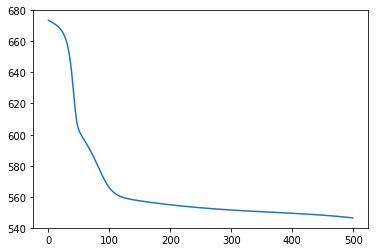

In [256]:
plt.plot(LossOverEpoch)
plt.show()

In [257]:
model.eval()
outputArray=[]
for data, labels in my_testloader:
    with torch.no_grad():
        output = model.forward(data)
        outputArray.append(output[0].numpy())
outputArray=np.array(outputArray).T

In [258]:
print((outputArray).shape)
Y_infered = librosa.istft(outputArray) 

(1025, 2740)


In [259]:
ipd.Audio(Y_infered,rate=sr)

In [260]:
ipd.Audio(y,rate=sr)

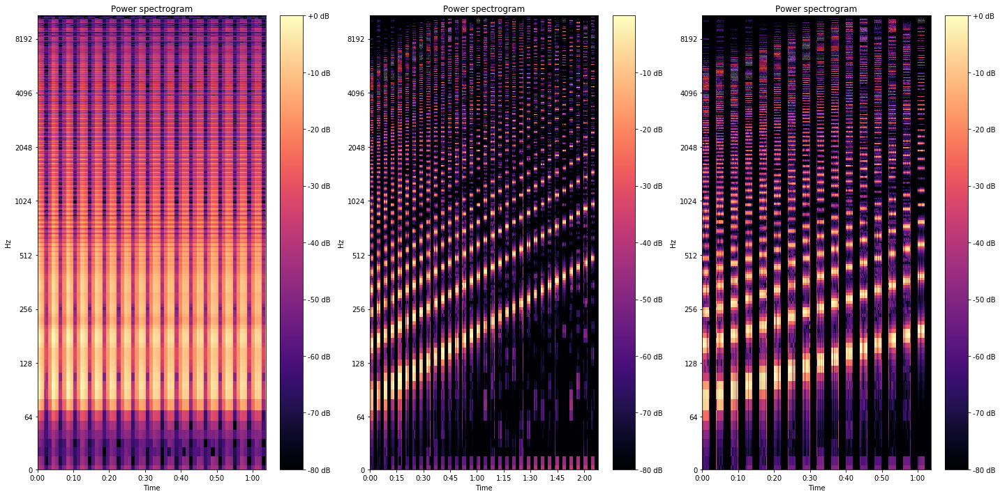

In [261]:

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
librosa.display.specshow(librosa.amplitude_to_db(outputArray,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

plt.subplot(1,3,2)
librosa.display.specshow(librosa.amplitude_to_db(D.real,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()


plt.subplot(1,3,3)
librosa.display.specshow(librosa.amplitude_to_db(tensor_y.numpy().T,
                                                  ref=np.max),
                          y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()


8.704448699951172
(1025,) (1025,)


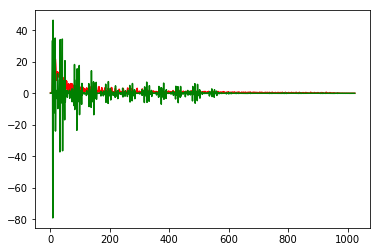

In [262]:
output=np.array(0);
with torch.no_grad():
        test=torch.zeros([1, 128], dtype=torch.float32)
       # test[0][46]=0.0;
        output = model.forward(test)
      #  test2=torch.ones([1, 1025], dtype=torch.float32)
      #  test2[0][46]=0.0;
        loss = criterion(output,torch.zeros([1, 1025], dtype=torch.float32))
        print(loss.item())
print(output.numpy()[0].shape,D_data[250].shape)
plt.plot(output.numpy()[0],'r')
plt.plot(D_data[250],'g')
plt.show()

In [263]:
print(output.numpy()[0].shape)

(1025,)


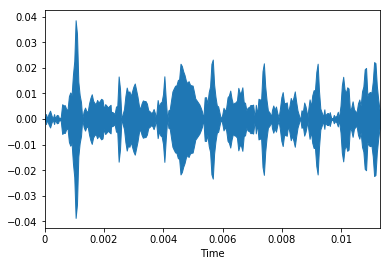

In [264]:
librosa.display.waveplot(Y_infered[:250], sr=sr);

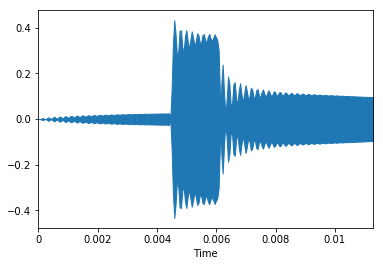

In [265]:
librosa.display.waveplot(y[:250], sr=sr);